https://towardsdatascience.com/extract-features-of-music-75a3f9bc265d

## New Approach

In [140]:
import librosa
import os
import music21 as m21

from math import log2, pow

import numpy as np

import IPython.display as ipd

import music21

import _ckwrap
from ckwrap.result import CkwrapResult

In [95]:
### загрузка файла
y, sr = librosa.load("[ONTIVA.COM] Pokémon Theme (8 Bit Remix Cover Version) [Tribute to Pokémon] - 8 Bit Universe-HQ.wav")

In [128]:
ipd.Audio(y, rate=sr)

In [96]:
### делаем onset_strength - это понадобится для определения темпа
onset_env = librosa.onset.onset_strength(y, sr=sr)

In [97]:
### получаем темп в beats per minute
tempo = librosa.beat.tempo(onset_envelope=onset_env, sr=sr)[0]
tempo

143.5546875

In [98]:
### определяем длительность трека
dur = librosa.get_duration(y=y, sr=sr)

In [99]:
size = 4

In [100]:
### один бит - одна четверть
### нам нужно исследовать одну тридцать вторую
### значит, длину в минутах делим на количество битов в минуту (получаем 1 четверь)
### и делим на 4 (size), чтобы получить 1 шестнадцатую
frame = (dur/60/tempo)*sr / size
frame = 2 ** np.round(np.log2(frame))

### чтобы получить максимальное количество фрэймов
### длительность в секундаъ умноженную на частоту дискредитизации
### делим на длительность одного фрэйма в сэмплах
max_frames = (dur*sr)/frame

frame, max_frames

(128.0, 33876.0078125)

In [101]:
### фрэйм должен быть в степени двойки?
### максимальное количество фрэймов не может быть дробным

In [102]:
y[1024:1024+128]

array([ 2.2042006e-08, -2.7949740e-08,  3.4161772e-08, -4.0431267e-08,
        4.6445287e-08, -5.1821139e-08,  5.6084026e-08, -5.8769221e-08,
        5.9302302e-08, -5.7080062e-08,  5.1461278e-08, -4.1658502e-08,
        2.7213130e-08, -7.3239370e-09, -1.8735593e-08,  5.1736841e-08,
       -9.2559119e-08,  1.4252247e-07, -2.0268926e-07,  2.7563811e-07,
       -3.6544736e-07,  4.7994268e-07, -6.3602562e-07,  8.7672328e-07,
       -1.3509090e-06,  3.0994493e-06,  5.5436253e-06, -1.1130076e-06,
        4.6036476e-07, -1.8787486e-07,  3.8087890e-08,  5.1849085e-08,
       -1.0420178e-07,  1.2839368e-07, -1.2872545e-07,  1.0711419e-07,
       -6.4280719e-08, -9.6193373e-11,  8.7459952e-08, -2.0156354e-07,
        3.4909468e-07, -5.4823562e-07,  8.4960061e-07, -1.4537759e-06,
        4.2917413e-06,  5.1183893e-06, -6.5497006e-06, -1.2934188e-05,
       -5.7070662e-07,  5.1279185e-06, -3.9754707e-07, -1.0569753e-06,
        6.5477529e-06,  1.1135423e-05, -8.2533043e-06, -4.9324435e-06,
      

In [103]:
y_fft = np.fft.fft(y[1024:1024+128])

In [104]:
np.abs(y_fft)

array([6.38073181e-05, 6.40219245e-05, 5.35458361e-05, 3.05335845e-05,
       2.71813215e-05, 3.11348008e-05, 2.35805950e-05, 2.43856538e-05,
       2.77629521e-05, 3.74243017e-05, 3.48609408e-05, 2.93097573e-05,
       5.09634566e-05, 5.69585520e-05, 7.21241503e-05, 1.51774975e-04,
       5.26007106e-05, 1.63286223e-05, 2.90817544e-05, 7.86194137e-05,
       3.02844406e-05, 1.46303040e-05, 3.20809131e-05, 2.60341594e-05,
       4.62181721e-05, 4.03518761e-05, 1.54719961e-05, 5.77488073e-05,
       1.21357126e-04, 5.96948640e-05, 1.15098335e-05, 4.97446033e-05,
       5.15405531e-05, 1.00950079e-04, 3.28824592e-05, 1.06560902e-04,
       4.20493425e-05, 6.21573695e-05, 5.94851379e-05, 7.51122803e-05,
       3.71019983e-05, 7.71020150e-05, 3.22873649e-05, 5.82899675e-05,
       6.74094693e-05, 5.98347920e-05, 6.53677453e-05, 8.78013430e-05,
       4.20749793e-05, 2.00914490e-05, 2.07744528e-05, 6.09000956e-05,
       5.42349818e-05, 3.19307522e-05, 1.37580861e-05, 3.82875690e-05,
      

In [105]:
### собираем функцию визуального представления фрэйма в виде разложения фурье

def plot_magnitude_spectrum(signal, title, sr, f_ratio=1):
    ### собственно разложение
    ft = np.fft.fft(signal)
    ### поскольку результат разложения - комплексное число, берём абсолютное значение чтобы отбросить мнимую часть
    magnitude_spectrum = np.abs(ft)
    
    # рисуем график
    plt.figure(figsize=(18, 5))
    
    ### частоты = это массив длинной в максимальное значение частоты
    ### а сами значения массива - это количество сэмплов, в которых встречается эта частота
    frequency = np.linspace(0, sr, len(magnitude_spectrum))
    num_freq_bins = int(len(frequency) * f_ratio)
    
    plt.plot(frequency[:num_freq_bins], magnitude_spectrum[:num_freq_bins])
    plt.xlabel('Frequency: Hz')
    plt.title(title)
    
    plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

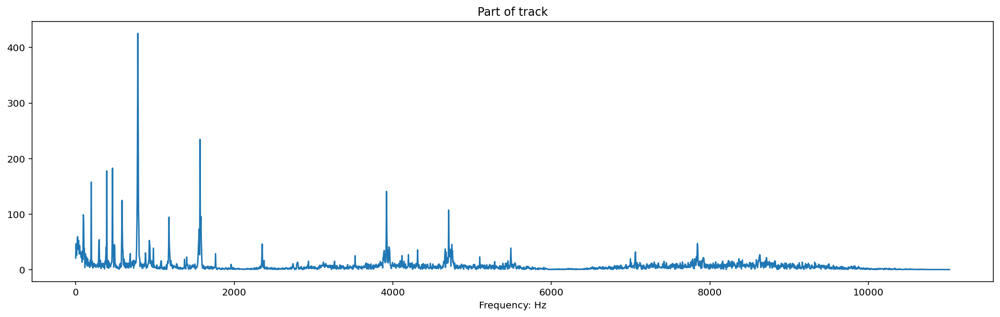

In [106]:
plot_magnitude_spectrum(y[int(sr/4*1):int(sr/4*2)], 'Part of track', sr, f_ratio=0.5)

In [107]:
### как вариант, работать с одним битом и постоянно смещать на 1 шестнадцатую
# предполагая что 1 бит = 1 четверть

In [108]:
ipd.Audio(y[int(sr/4*1):int(sr/4*2)], rate=sr)

In [109]:
y_sq = y[int(sr/4*1):int(sr/4*2)]**2
y_sq.shape

(5513,)

In [110]:
### если возвести трек в квадрат, то он как будто бы зашумляется
ipd.Audio(y_sq,rate=sr)

In [171]:
def plot_magnitude_spectrum_sq(signal, title, sr, f_ratio=1):
    ft = np.fft.fft(signal)
    magnitude_spectrum = np.abs(ft)**4
  
    # plot magnitude specturm
    
    plt.figure(figsize=(18, 5))
    
    frequency = np.linspace(0, sr, len(magnitude_spectrum))
    
    num_freq_bins = int(len(frequency) * f_ratio)
    
    plt.plot(frequency[:num_freq_bins], magnitude_spectrum[:num_freq_bins])
    plt.xlabel('Frequency: Hz')
    plt.title(title)
    
    plt.show()
    
    # finding the value of most frequent frequency
    print(magnitude_spectrum)
        
    result = frequency[np.where(magnitude_spectrum == max(magnitude_spectrum))[0][0]]
    
    # making tone out of this value
    output = librosa.tone(result, sr=sr, duration=1)
    return ipd.Audio(output, rate=sr) 
        

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

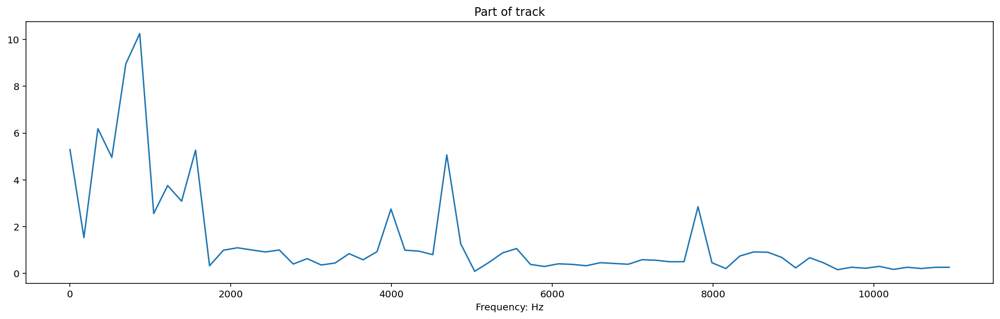

In [112]:
plot_magnitude_spectrum(y[int(frame)*512:int(frame)*513], 'Part of track', sr, f_ratio=0.5)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

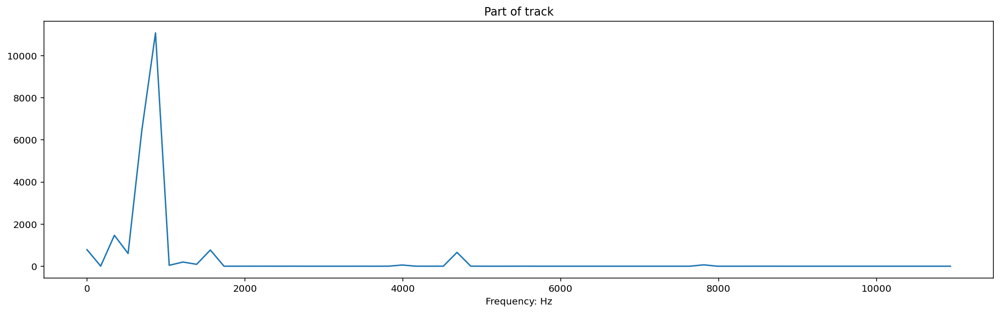

[7.86986840e+02 5.41995735e+00 1.46782226e+03 6.05411896e+02
 6.44366183e+03 1.10864174e+04 4.25621427e+01 1.98318245e+02
 9.03462409e+01 7.69273169e+02 1.03367553e-02 9.40375116e-01
 1.40186588e+00 9.88701468e-01 6.83038669e-01 9.72360293e-01
 2.37796347e-02 1.49470192e-01 1.52453016e-02 3.61337255e-02
 4.91085189e-01 1.08825209e-01 7.21914315e-01 5.68936132e+01
 9.39821937e-01 7.97407460e-01 3.94139905e-01 6.57924061e+02
 2.48441480e+00 4.19763822e-05 4.25130806e-02 5.71473986e-01
 1.24457176e+00 1.96253344e-02 6.98339363e-03 2.61035700e-02
 2.01457660e-02 1.03441593e-02 4.09268210e-02 3.02307229e-02
 2.14370177e-02 1.11691761e-01 9.37707223e-02 5.72967017e-02
 5.92663510e-02 6.56024236e+01 4.04450358e-02 1.56589277e-03
 2.94201716e-01 6.86459646e-01 6.48869731e-01 2.09712183e-01
 2.67697882e-03 1.93434721e-01 3.85320611e-02 5.11813718e-04
 4.18343327e-03 2.01138960e-03 7.32672563e-03 7.04337876e-04
 4.13775580e-03 1.61102987e-03 4.02905699e-03 4.15551692e-03
 3.21185347e-03 4.155516

In [172]:
plot_magnitude_spectrum_sq(y[int(frame)*512:int(frame)*513], 'Part of track', sr, f_ratio=0.5)

In [119]:
notes = []

for i in range(int((dur*sr)/(1024/size))-1):
    ft = np.fft.fft(y[int(1024/size)*i: int(1024/size)*(i+1)])
    magnitude_spectrum = np.abs(ft)**4
    frequency = np.linspace(0, sr, len(magnitude_spectrum))
    notes.append(frequency[np.where(magnitude_spectrum == max(magnitude_spectrum))[0][0]])

In [120]:
len(notes)

16937

In [129]:
def key_to_freq(item):
    key_names = ["c", "d-", "d", "e-", "e", "f", "g-", "g", "a-", "A", "b-", "b"]
    h = round(12*log2(item/16))
    octave = h//12
    key = h % 12
    return str(key_names[key])+str(octave)

In [130]:
melody = m21.stream.Stream()

for entry in notes:
    if entry == 0 or entry > 1046.50 or entry < 65.41:
        melody.append(m21.note.Rest(quarterLength=1/size))
    else:
        melody.append(m21.note.Note(key_to_freq(entry), quarterLength=1/size))

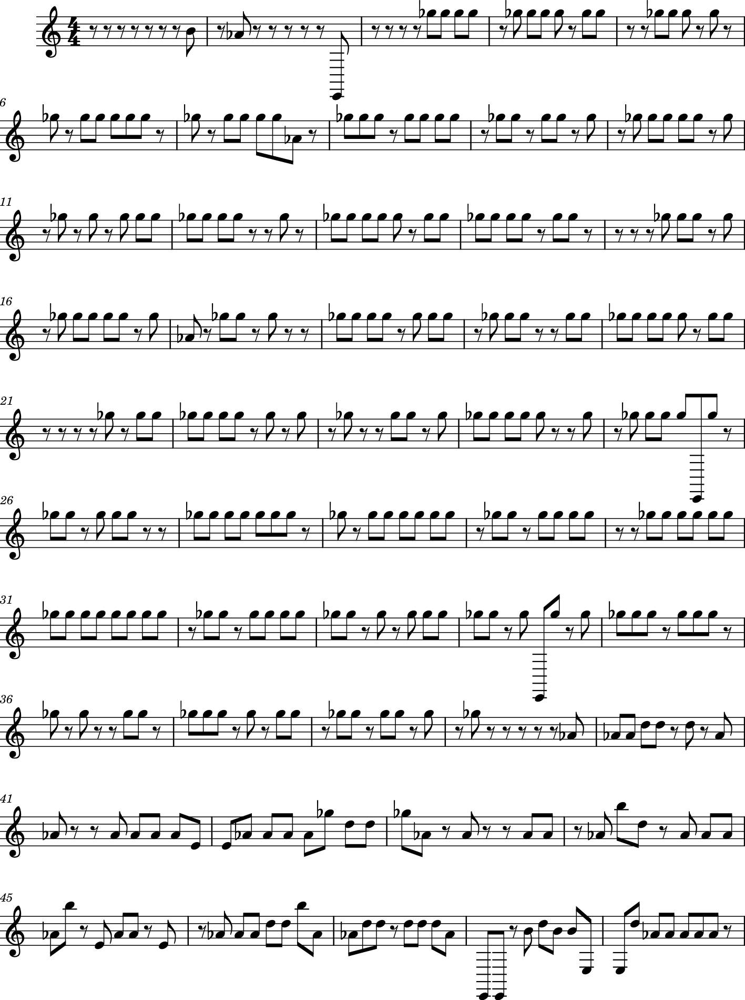

In [122]:
melody.show('ipython.musicxml.png')

In [127]:
tone1 = librosa.tone(440, sr=22050, duration=1)
ipd.Audio(tone1, rate=22050)
ipd.Audio(tone1, rate=22050*2)